In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [1]:
from importlib import reload
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tfl
from sklearn.cluster import KMeans

import hsilib as hl
hl = reload(hl)

In [3]:
import spectral.io.envi as envi
hsi_path = r'C:\Users\konst\jupyter_notebook\HSI\data envil\moffet\\'
moffett_hsi = envi.open(hsi_path + r'f080611t01p00r07rdn_c_sc01_ort_img.hdr',
                        hsi_path + r'f080611t01p00r07rdn_c_sc01_ort_img')

HSI = np.array(np.rot90(moffett_hsi.open_memmap(writble = True)))

#HSI = HSI[..., :80]
height, width, bands = HSI.shape

In [5]:
HSI.shape

(753, 1924, 224)

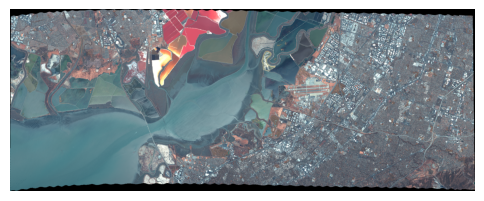

In [11]:
color_image = hl.HSI_to_RGB(HSI, (37, 18, 11))
hl.show(color_image)

In [12]:
reference_coords = np.array(((540,  470), #water
                             (288,  758), #contaminated
                             (154,  834), #swamps
                             (315, 1334), #soil
                             (335, 1360), #vegetable
                             (305, 1280), #concrete
                             (278,  606), #salt
                             (18,   811)), #salt_water
                             dtype = int)

name_reference = ("water", "dirt", "swamps", "soil", "vegetable", "concrete", "salt", "salt_water")

colors_class = np.array(((0.56, 0.56, 1), (0.64, 0.28, 0.64), (0.05, 0.54, 0.13), (0.72, 0.45, 0.2),
                        (0, 0.9, 0), (0.29, 0.29, 0.29), (1, 1, 0), (1, 0, 0)))

In [13]:
color_image = hl.HSI_to_RGB(HSI, (37, 18, 11))
reference_pix = hl.calc_ref(reference_coords, HSI, 1)

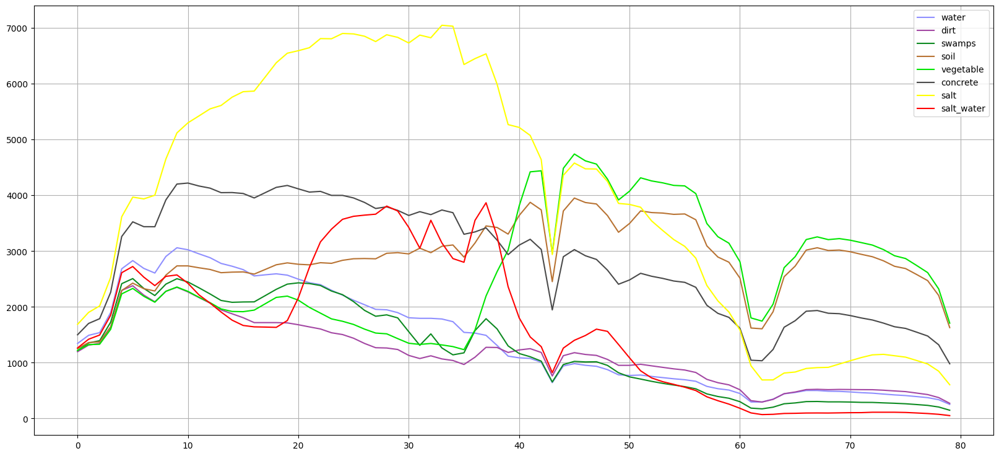

In [14]:
reference_pix
plt.figure(figsize = (20, 9))
for i in range(reference_coords.shape[0]): #(0, 5):#
    plt.plot(reference_pix[i], color = colors_class[i], label = name_reference[i])
    #plt.hlines(reference_pix[i].mean(), 0, 224, color = colors_class[i])
plt.legend()
plt.grid()
plt.show()

In [15]:
number_of_modes = 12
reference_imfs = hl.EMD(reference_pix, number_of_modes)

обработано 8 пикселей из 8

In [16]:
reference_imfs.shape

(12, 8, 80)

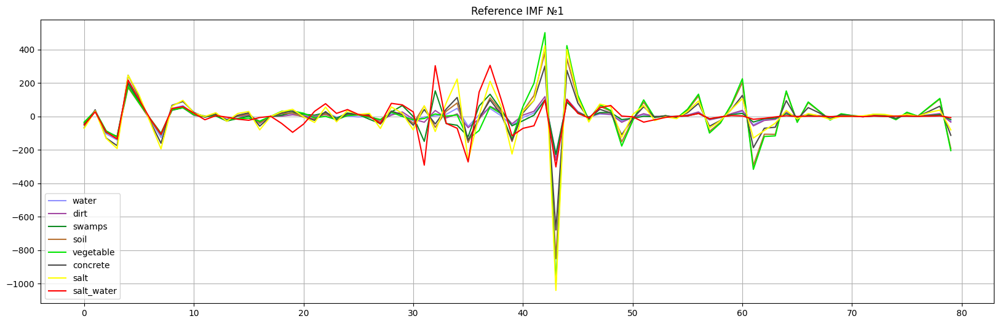

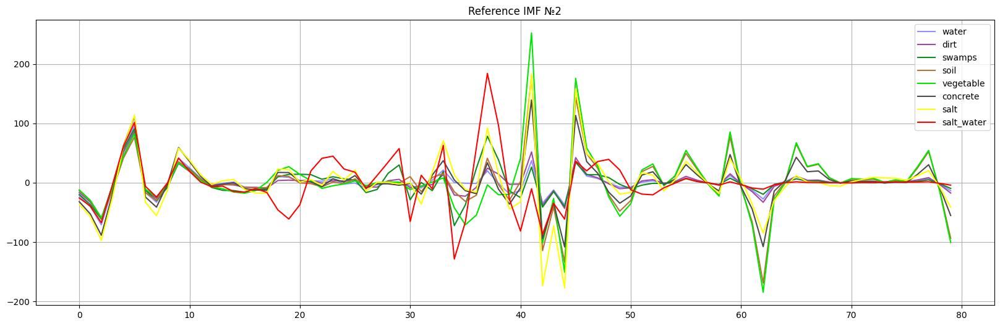

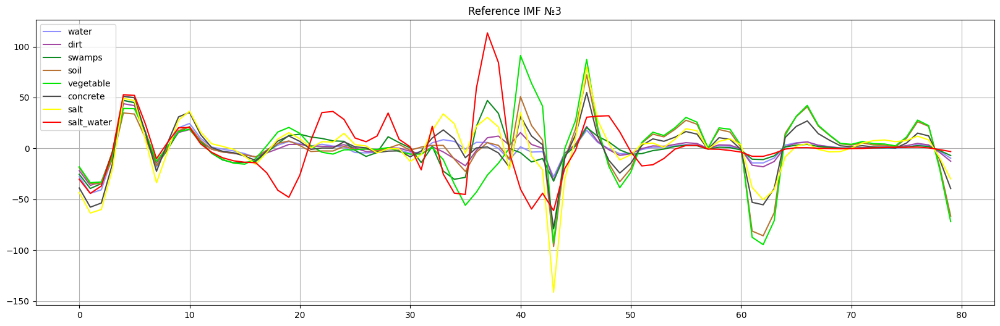

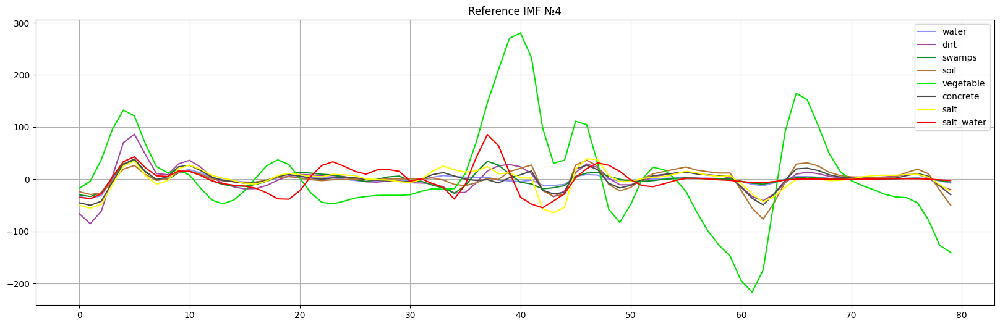

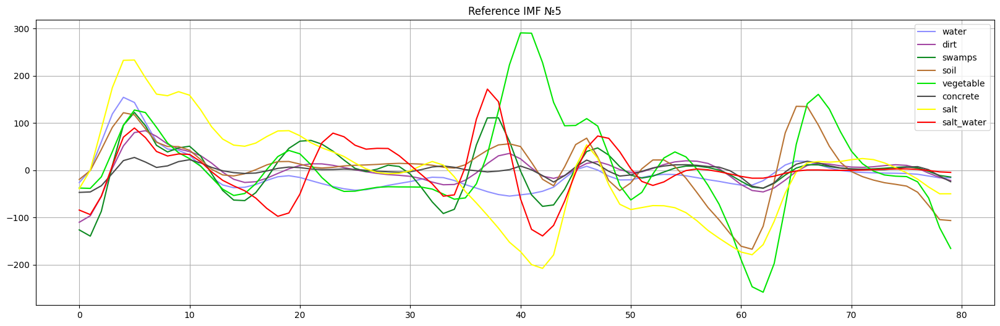

...

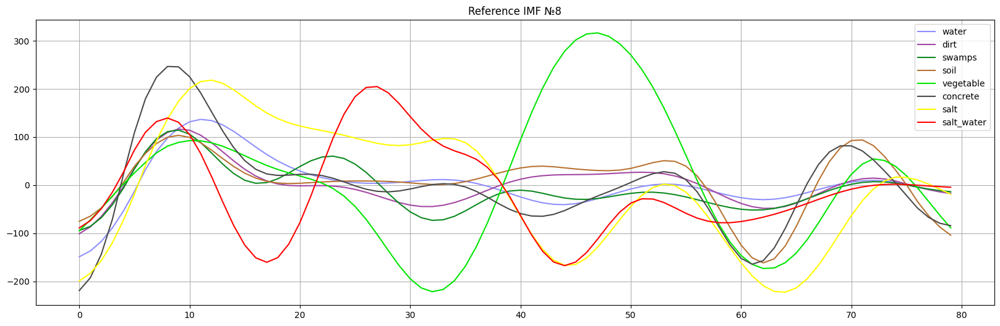

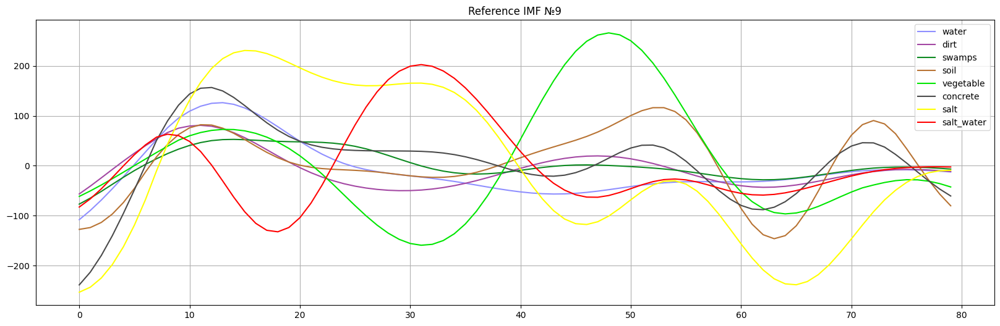

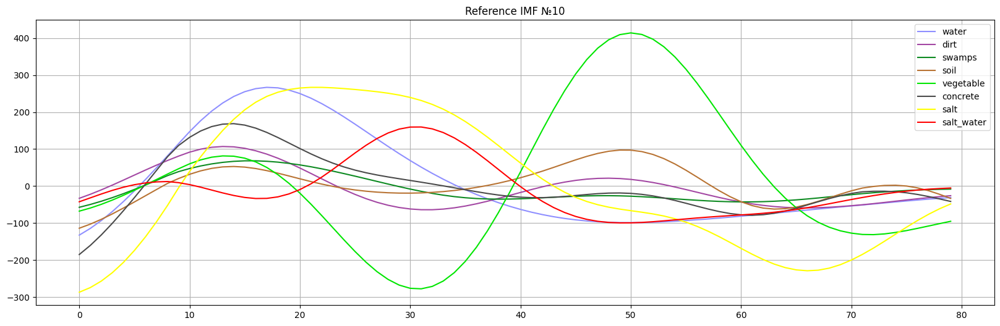

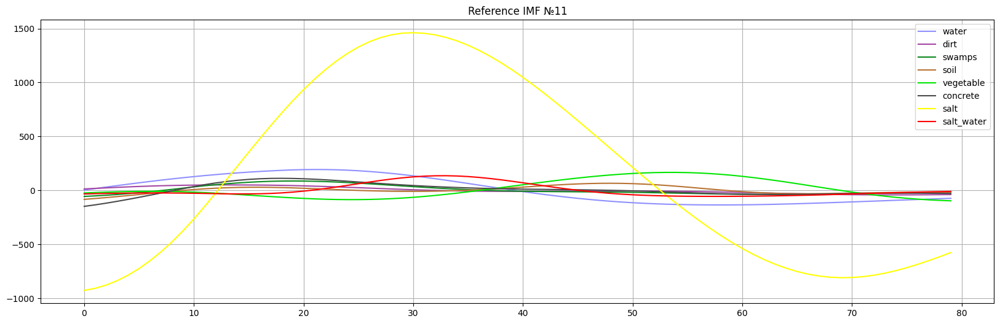

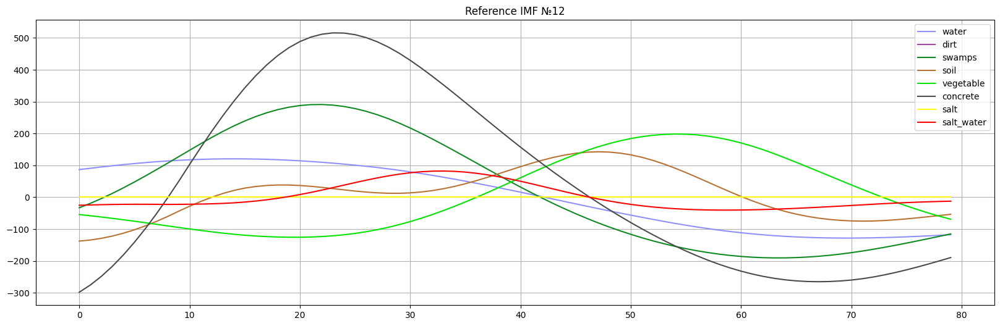

In [17]:
for i in range(number_of_modes):
    reference_pix
    plt.figure(figsize = (20, 6))
    plt.title("Reference IMF №" + str(i + 1))
    for j in range(reference_imfs.shape[1]):
        plt.plot(reference_imfs[i, j], color = colors_class[j], label = name_reference[j])
    plt.legend()
    plt.grid()
    plt.show()
    #plt.tight_layout()
    #plt.savefig("./image-data/emd-2-ref/reference/Reference IMF №" + str(i + 1) + ".png")
    #plt.close()

In [18]:
IMFs = np.load("12imfs.moffetfield.win(3).npy")

In [21]:
IMFs = IMFs[..., :80]
IMFs.shape

(12, 753, 1924, 80)

In [22]:
reference_imfs.shape

(12, 8, 80)

-----------------------

In [23]:
def clear_KMeans_skl(imfs, HSI, number_of_clusters = 4, reference = None):
    
    HSI = np.reshape(HSI, (HSI.shape[0] * HSI.shape[1], HSI.shape[2]))
    
    height, width, bands = imfs.shape
    imfs = np.reshape(imfs, (height * width, bands))
    
    mask = np.arange(0, imfs.shape[0], dtype = int)
    bool_mask = np.all(HSI == -50, axis = 1)
    mask[bool_mask] = -1
    
    clear_imfs = imfs[mask != -1]
    clear_mask = mask[mask != -1]
    
    if reference is None:
        kmeans = KMeans(n_clusters = number_of_clusters, random_state = 0, n_init = "auto").fit(clear_imfs)
    else:
        kmeans = KMeans(n_clusters = reference.shape[0], init = reference, n_init = "auto").fit(clear_imfs)
    
    centers = kmeans.cluster_centers_
    clear_labels = kmeans.labels_
    
    labels = np.zeros(shape = height * width, dtype = int)
    
    for i in range(clear_mask.shape[0]):
        labels[clear_mask[i]] = clear_labels[i] + 1
    
    labels = np.reshape(labels, (height, width))
    
    return centers, labels

--------------

# KMeans with initial references.

In [144]:
#n_imf = 11
#kmeans = KMeans(n_clusters = reference_imfs.shape[1], init = reference_imfs[n_imf], n_init = "auto").fit(np.reshape(IMFs[n_imf], (height * width, bands)))
#centers = kmeans.cluster_centers_
#labels = np.reshape(kmeans.labels_, (height, width))

In [24]:
n_imf = 4
centers, labels = clear_KMeans_skl(imfs = IMFs[n_imf], HSI = HSI, reference = reference_imfs[n_imf])

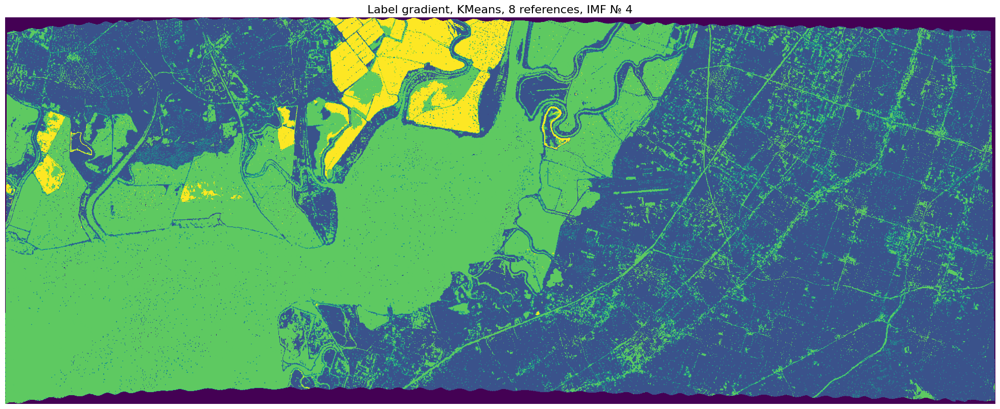

In [25]:
title = "Label gradient, KMeans, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf)
hl.show(labels, title, (25, 15))

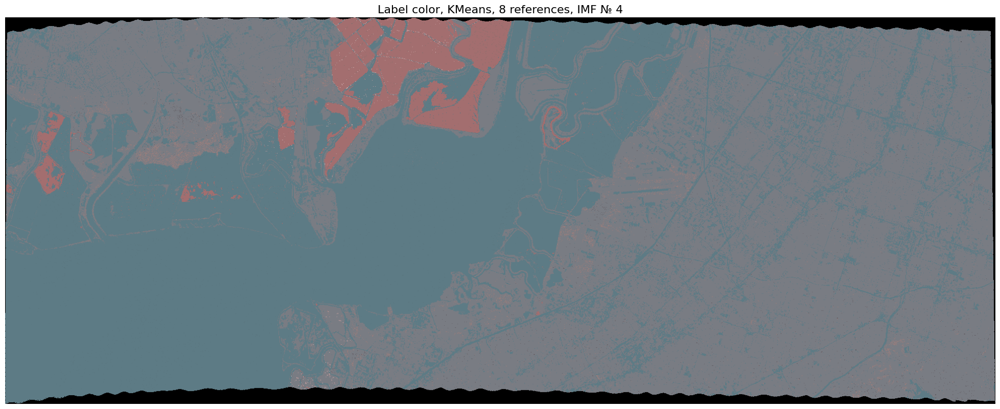

In [26]:
color_label = hl.RGB_labels(color_image, labels)

title = "Label color, KMeans, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf)
hl.show(color_label, title, (25, 15))

----------------------------

In [29]:
for n_imf in range(reference_imfs.shape[0]):
    #kmeans = kmeans = KMeans(n_clusters = reference_imfs.shape[1], init = reference_imfs[n_imf], n_init = "auto").fit(np.reshape(IMFs[n_imf], (height * width, bands)))
    #centers = kmeans.cluster_centers_
    #kmean_labels = np.reshape(kmeans.labels_, (height, width))
    
    centers, kmean_labels = clear_KMeans_skl(imfs = IMFs[n_imf], HSI = HSI, reference = reference_imfs[n_imf])
    
    title = "Label map, KMeans, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf + 1)
    
    plt.figure(figsize = (25, 10))
    plt.imshow(kmean_labels)
    plt.axis("off")
    plt.title(title)
    plt.tight_layout()
    #plt.savefig("./image-data/emd-2-ref/KMeans-with-initial-references/labals-map/" + title + ".png")
    plt.savefig("./image-data/emd-2-ref/first-80-bands/KMeans-with-initial-references/labals-map/" + title + ".png")
    plt.close()
    
    kmean_color_label = hl.RGB_labels(color_image, kmean_labels)
    title = "Color map, KMeans, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf + 1)
    
    plt.figure(figsize = (25, 10))
    plt.imshow(kmean_color_label)
    plt.axis("off")
    plt.title(title)
    plt.tight_layout()
    #plt.savefig("./image-data/emd-2-ref/KMeans-with-initial-references/colors-map/" + title + ".png")
    plt.savefig("./image-data/emd-2-ref/first-80-bands/KMeans-with-initial-references/colors-map/" + title + ".png")
    plt.close()

# KMeans without initial references.

In [137]:
n_imf = 11
n_clust = 8
kmeans = KMeans(n_clusters = n_clust, random_state = 0, n_init = "auto").fit(np.reshape(IMFs[n_imf], (height * width, bands)))

In [138]:
centers = kmeans.cluster_centers_
labels = np.reshape(kmeans.labels_, (height, width))

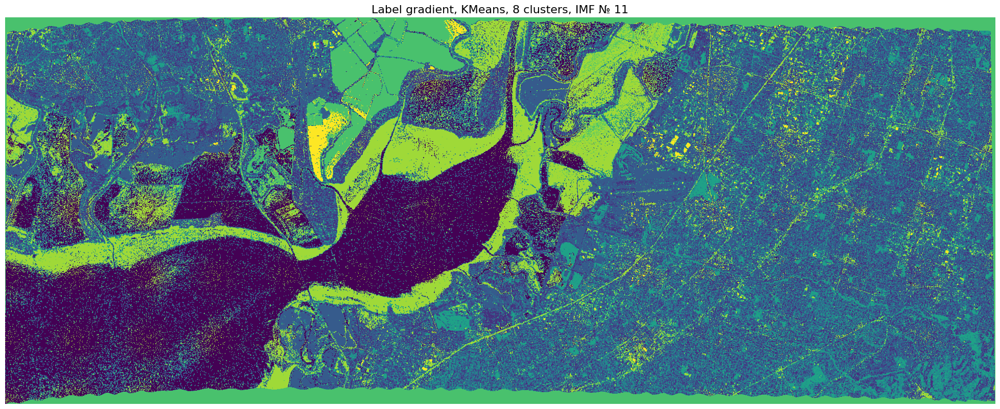

In [139]:
title = "Label gradient, KMeans, " + str(n_clust) + " clusters, IMF № " + str(n_imf)
hl.show(labels, title, (25, 15))

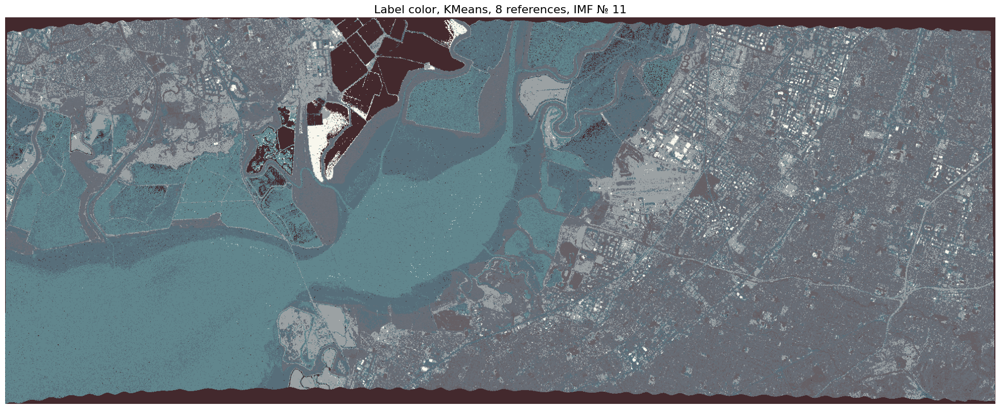

In [142]:
color_label = hl.RGB_labels(color_image, labels)

title = "Label color, KMeans, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf)
hl.show(color_label, title, (25, 15))

------------------------------

In [185]:
n_clust = 8
for n_imf in range(reference_imfs.shape[0]):
    #kmeans = kmeans = KMeans(n_clusters = n_clust, random_state = 0, n_init = "auto").fit(np.reshape(IMFs[n_imf], (height * width, bands)))
    #centers = kmeans.cluster_centers_
    #kmean_wr_labels = np.reshape(kmeans.labels_, (height, width))
    
    centers, kmean_wr_labels = clear_KMeans_skl(imfs = IMFs[n_imf], HSI = HSI, number_of_clusters = n_clust)
    
    title = "Label map, KMeans, " + str(n_clust) + " clusters, IMF № " + str(n_imf + 1)
    
    plt.figure(figsize = (25, 10))
    plt.imshow(kmean_wr_labels)
    plt.axis("off")
    plt.title(title)
    plt.tight_layout()
    plt.savefig("./image-data/emd-2-ref/KMeans-without-initial-references/labals-map/" + title + ".png")
    plt.close()
    
    kmean_wr_color_label = hl.RGB_labels(color_image, kmean_wr_labels)
    title = "Color map, KMeans, " + str(n_clust) + " clusters, IMF № " + str(n_imf + 1)
    
    plt.figure(figsize = (25, 10))
    plt.imshow(kmean_wr_color_label)
    plt.axis("off")
    plt.title(title)
    plt.tight_layout()
    plt.savefig("./image-data/emd-2-ref/KMeans-without-initial-references/colors-map/" + title + ".png")
    plt.close()

# Closest cosine angle.

In [30]:
def cos_angle(vector1, vector2):
    unit_vector1 = vector1 / np.linalg.norm(vector1)
    unit_vector2 = vector2 / np.linalg.norm(vector2)

    return np.dot(unit_vector1, unit_vector2)

In [31]:
reference_imfs.shape

(12, 8, 80)

In [32]:
IMFs.shape

(12, 753, 1924, 80)

In [33]:
def closest_angle(n_imf):
    angle_labels = np.zeros(shape = (height, width), dtype = int)
    
    for i in range(height):
        for j in range(width):
            
            angle_max = cos_angle(IMFs[n_imf, i, j], reference_imfs[n_imf, 0])
            pix_label = 0
            
            for k in range(1, reference_imfs.shape[1]):
                new_angle = cos_angle(IMFs[n_imf, i, j], reference_imfs[n_imf, k])
                
                if new_angle > angle_max:
                    angle_max = new_angle
                    pix_label = k
                    
            angle_labels[i, j] = pix_label
            
        pix = (i * width) + height
        print('\r', end = '')
        print("обработано " + str(pix) + " пикселей из " + str(height * width), end = '')
        
    return angle_labels

In [ ]:
n_imf = 11
angle_labels = closest_angle(n_imf)

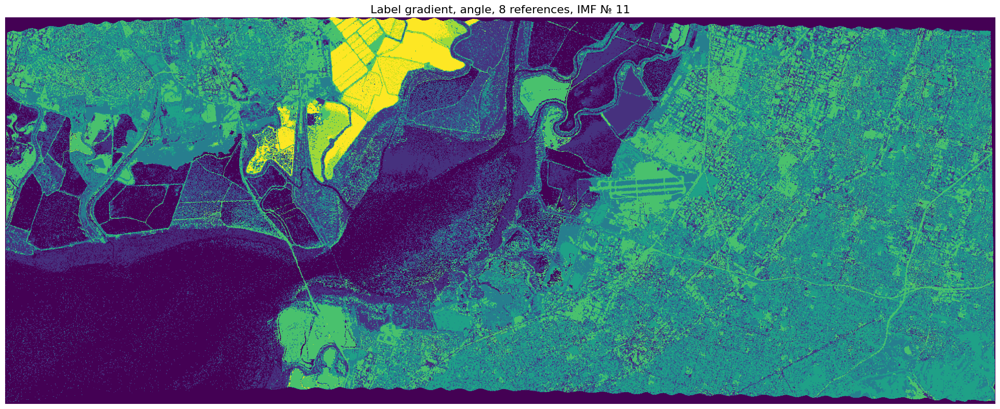

In [152]:
title = "Label gradient, angle, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf)
hl.show(angle_labels, title, (25, 15))

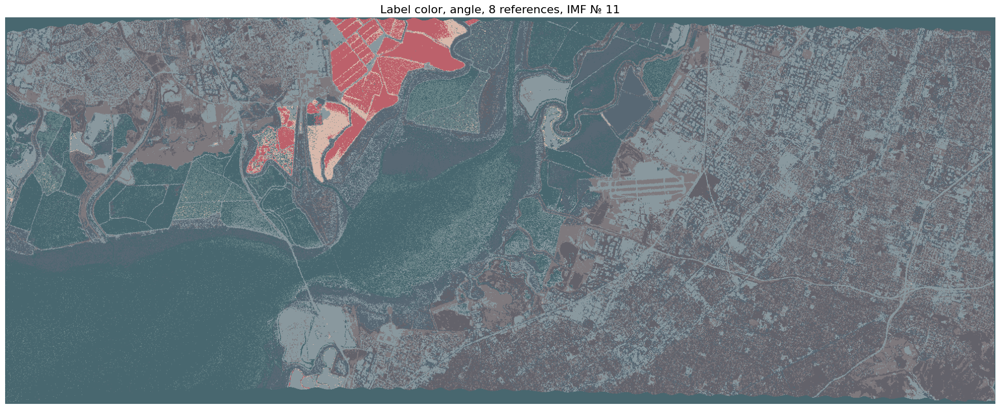

In [153]:
color_label = hl.RGB_labels(color_image, angle_labels)

title = "Label color, angle, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf)
hl.show(color_label, title, (25, 15))

-----------------------

In [34]:
for n_imf in range(reference_imfs.shape[0]):
    
    angle_labels = closest_angle(n_imf)
    title = "Label map, closest cosine angle, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf + 1)
    
    plt.figure(figsize = (25, 10))
    plt.imshow(angle_labels)
    plt.axis("off")
    plt.title(title)
    plt.tight_layout()
    #plt.savefig("./image-data/emd-2-ref/Closest-cosine-angle/labals-map/" + title + ".png")
    plt.savefig("./image-data/emd-2-ref/first-80-bands/Closest-cosine-angle/labals-map/" + title + ".png")
    plt.close()
    
    color_label = hl.RGB_labels(color_image, angle_labels)
    title = "Color map, closest cosine angle, " + str(reference_imfs.shape[1]) + " references, IMF № " + str(n_imf + 1)
    
    plt.figure(figsize = (25, 10))
    plt.imshow(color_label)
    plt.axis("off")
    plt.title(title)
    plt.tight_layout()
    #plt.savefig("./image-data/emd-2-ref/Closest-cosine-angle/colors-map/" + title + ".png")
    plt.savefig("./image-data/emd-2-ref/first-80-bands/Closest-cosine-angle/colors-map/" + title + ".png")
    plt.close()

C:\Users\konst\AppData\Local\Temp\ipykernel_6324\2902285434.py:2: RuntimeWarning: invalid value encountered in true_divide
  unit_vector1 = vector1 / np.linalg.norm(vector1)


обработано 735721 пикселей из 1448772

KeyboardInterrupt: 